#Τεχνολογία Και Ανάλυση Εικόνων και Βίντεο

##Άσκηση 1: Επεξεργασία εικόνας, φίλτρα, ακμές και εκτίμηση κίνησης

**ΣΤΟΙΧΕΙΑ ΟΜΑΔΑΣ**

Ομάδα: Μ09

Χαρδούβελης Γεώργιος-Ορέστης Α.Μ. 03115100<br>
Βεργοπούλου Έλενα Α.Μ. 03116723<br>

Υποσημείωση: Για να τρέξει ο κώδικας πρέπει να ανεβούν τα αρχεία 'elena.jpg' και 'preston.jpg' που επισυνάπτονται στα παραδοτέα.


In [0]:
# Εισαγωγή απαραίτητων imports εδώ
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import skimage.util as ski
from scipy import ndimage as ndi
from skimage import filters
from skimage.morphology import disk
import imutils
from skimage import feature
from skimage.filters import laplace
from scipy import signal
import matplotlib.pyplot as plt
from skimage import img_as_float
import matplotlib.cm as cm
from skimage.transform import rescale, resize, downscale_local_mean

# Ερώτημα 1 (50%)
Στο ερώτημα αυτό θα χρησιμοποιήσετε αλγορίθμους εύρεσης ακμών, για να παράξετε ένα **cartoonified** αποτέλεσμα της εικόνας εισόδου. Το σκεπτικό είναι να εκμεταλευθείτε τις φυσικές ακμές της εικόνας για να δημιουργήσετε "περιγράμματα".

Η υλοποίηση του ερωτήματος θα ακολουθεί τα εξής βήματα:

1.   Να δημιουργήσετε **μια εικόνα με τα πρόσωπα των μελών της ομάδας σας**. Μπορείτε να αποκτήσετε την εικόνα κάθε μέλους με όποιον τρόπο θέλετε, αρκεί να είναι όσο πιο καθαρή γίνεται, σε όσο το δυνατόν καλύτερες συνθήκες φωτισμού. Οι διαστάσεις των ατομικών εικόνων προτείνουμε να είναι **512x288**.
  
- **Για ομάδες 2 ατόμων:** Να φορτώσετε και να ενώσετε, με τη χρήση κώδικα python, τις εικόνες των επι μέρους μελών σε μια τελική εικόνα  (**512x576**.)


**Απάντηση**

Κάθε μέλος της ομάδας επέλεξε μια εικόνα του εαυτού του με υψηλή ανάλυση και καλές συνθήκες φωτισμού ώστε να φαίνονται καθαρά τα χαρακτηριστικά της εικόνας για την εκολη επεξεργασία στα επόμενα βήματα.

Κάθε φωτογραφία κόπηκε κατάλληλα και ύστερα έγινε τροποποίηση του μεγέθος της σε εξωτερικό πρόγραμμα ώστε να μην προκύψει παραμόρφωση αλλά και να κρατήσουμε μεγάλο μέρος της φωτογραφίας ώστε να είναι εμφανή η εύρεση ακμών σε επόμενα σημεία.

Κάθε ατομική φωτογραφία είχε διαστάσεις 512x288 ώστε όταν ενώθηκαν κάθετα να σχηματιστεί μια εικόνα διαστάσεων 512x576, όπως φαίνεται παρακάτω.

BGR photo
Size = 512 x 576


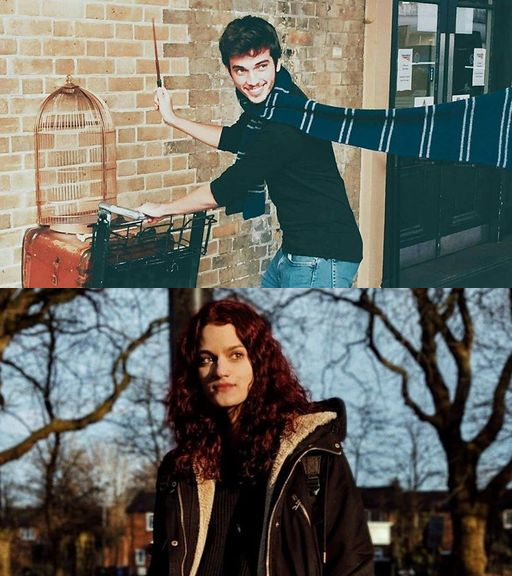

In [0]:
preImageName = 'prestos.jpg' 
elImageName = 'elena.jpg' 

pre = cv2.imread(preImageName) 
el = cv2.imread(elImageName) 
bob= np.concatenate((pre,el),axis=0) #the joined picture with final dimensions 512x576
print('BGR photo')
print('Size =',len(bob[0]),'x',len(bob))
cv2_imshow(bob)

2. Να επιλέξετε τον κατάλληλο χρωματικό χώρο για την εικόνα εισόδου σας.

**Απάντηση**

Παραπάνω βλέπουμε την αναπαράσταση της εικόνας του προηγούμενου βήματος σε διαφορετικούς χρωματικούς χώρους πέρα από τον RGB που χρησιμοποιούμε συνήθως. 

Οι χρωματικοί χώροι συνήθως αποτελούνται από 3 κανάλια, όπου ένα κανάλι τους αφορά στην ένταση της εικόνας (π.χ. φωτεινότητα) και τα δύο άλλα κανάλια τους αντιπροσωπεύουν το χρώμα (π.χ. απόχρωση και κορεσμό).

Συγκεκριμένα, η εικόνα απεικονίζεται και στους BGR, HSV, LAB , YCrCb και GRAY colorspaces.

Τελικώς επιλέγουμε τον GRAY χρωματικό χώρο ως κατάλληλο για την περαιτέρω επεξεργασία της εικόνας. Σε πολλές περιπτώσεις επεξεργασίας εικόνας, όπως είδαμε και στο εργαστήριο, αναπαρηστούμε μια εικόνα σε κλίμακα του γκρι πρωτού την επεξεργαστούμε.

Στην συγκεκριμένη περίπτωση είναι η κατάλληλη επιλογή, μιας και διακρίνονται καθαρά η αλλαγές στην φωτεινότητα, ενώ ταυτόχρονα η εικόνα αναπαριστάται από ένα μόνο κανάλι -σε αντίθεση με τους υπόλοιπους χρωματικούς χώρους-, κάτι πoυ διευκολύνει την επεξεργασίας της.

The BGR colorspace:


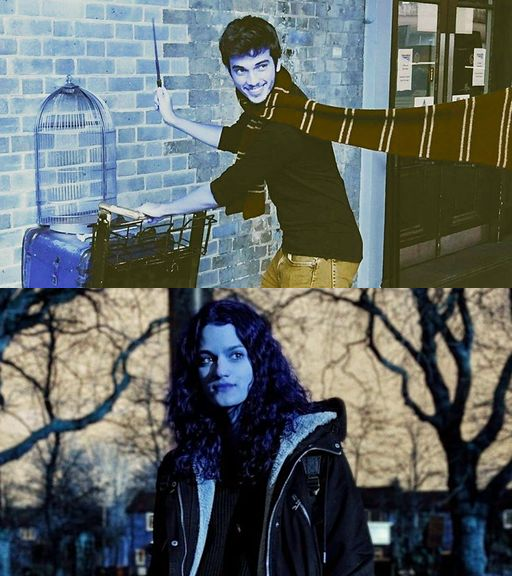


THe HSV colorspace:


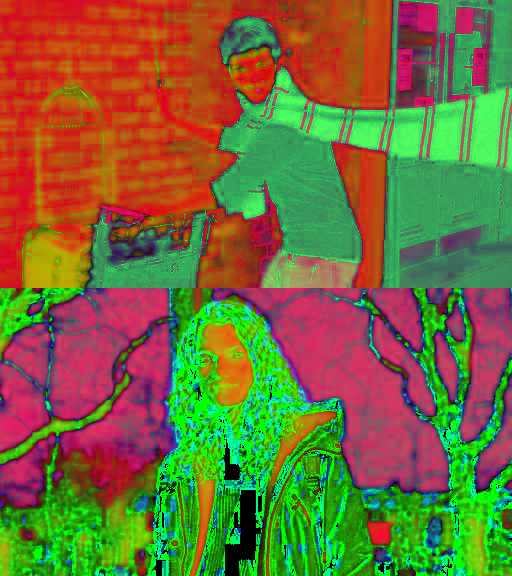


The LAB colorspace:


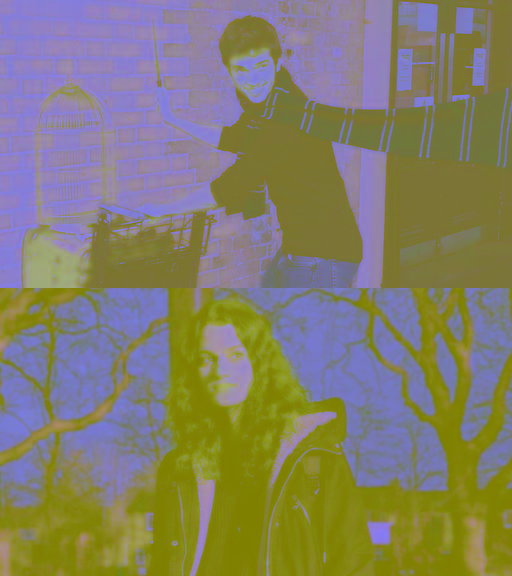


The YCrCb colorspace:


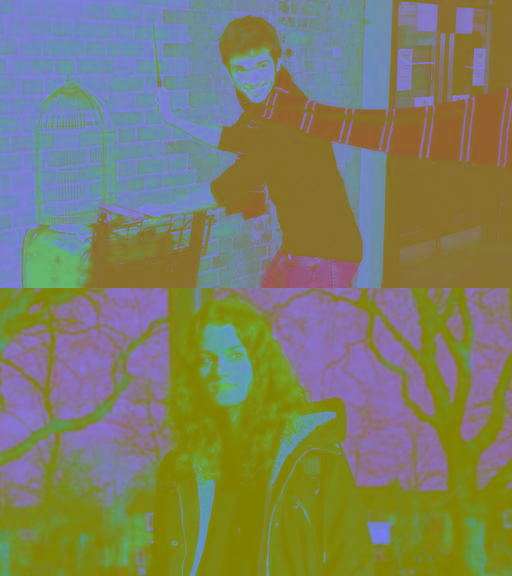


The GRAY colorspace:


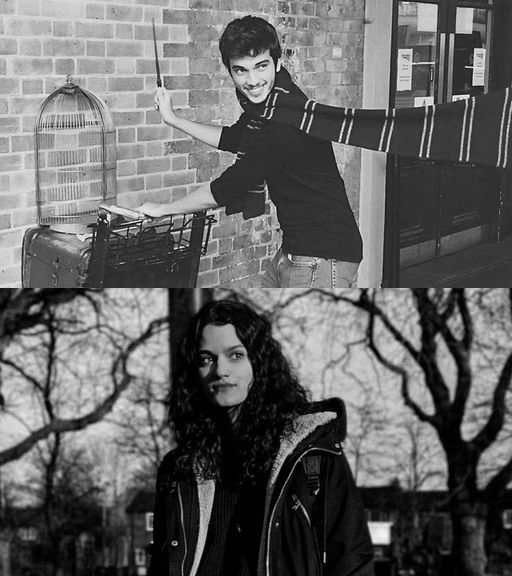

In [0]:
print('The BGR colorspace:') 
bobGBR = cv2.cvtColor(bob, cv2.COLOR_RGB2BGR) 
cv2_imshow(bobGBR)

print()
print('THe HSV colorspace:')
bobHSV = cv2.cvtColor(bob, cv2.COLOR_BGR2HSV)
cv2_imshow(bobHSV)

print()
print('The LAB colorspace:')
bobLAB = cv2.cvtColor(bob, cv2.COLOR_BGR2LAB)
cv2_imshow(bobLAB)

print()
print('The YCrCb colorspace:')
bobYCrCb = cv2.cvtColor(bob, cv2.COLOR_BGR2YCrCb)
cv2_imshow(bobYCrCb)

print()
print('The GRAY colorspace:')
bobGRAY = cv2.cvtColor(bob, cv2.COLOR_RGB2GRAY) 
cv2_imshow(bobGRAY)


3.   Να εφαρμόσετε θόρυβο στην εικόνα, χρησιμοποιώντας τη μέθοδο `random_noise` του πακέτου `skimage.util` και να ακολουθήστε τα παρακάτω, μοναδικά για την κάθε ομάδα, βήματα. Στη συνέχεια να τυπώσετε το αποτέλεσμα.

*   **Gaussian** θόρυβο, με `seed` ίσο με το **τελευταίο** ψηφίο του **ΑΜ** του πρώτου (ή μοναδικού) μέλους της ομάδας.
*   **Salt and Pepper** θόρυβο με `seed` ίσο με το **τελευταίο** ψηφίο του **ΑΜ** του πρώτου (ή μοναδικού) μέλους της ομάδας και `amount` που δίνεται από τον τύπο:

  $amount(x)=\frac{1}{90}x + 0.3$

  όπου $x$ το **προτελευταίο** ψηφίο του **ΑΜ** του ίδιου μέλους. Ο παραπάνω τύπος θα πρέπει να υλοποιηθεί σε ξεχωριστή **μέθοδο** στον κώδικά σας και να καλείται όταν χρειαστεί.

**Απάντηση** 

Το ΑΜ του Χαρδούβελη Ορέστη, που απεικονίζεται ως το πρώτο μέλος της ομάδας στο έγγραφο "Τελικές ομάδες του εργαστηρίου Τεχνολογία και Αναλύση Εικόνων και Βίντεο", είναι 03115100. Έτσι τόσο το τελευταίο όσο και το προτελευταίο ψηφίο που χρησιμοποιούνται στον παρακάτων κώδικα είναι το μηδέν. 

Στη συνέχεια,  χρησιμοποιώντας τη μέθοδο `random_noise` του πακέτου `skimage.util` και ακολουθώντας τις παραπάνω οδηγίες προκύπτουν οι δύο εικόνες με θόρυβο Gaussian και Salt and Pepper αντίστοιχα, όπου και απεικονίζονται παρακάτω.

Πιο συγκεκριμένα, όταν προσθέτουμε Gaussian θόρυβο, προσθέτουμε ουσιαστικά θόρυβο η συνάρτηση πυκνότητας πιθανότητας του οποίου ακολουθεί την κανονική κατανομή $p(x) = \frac{e^{-(x - \mu)^{2}/(2\sigma^{2}) }} {\sigma\sqrt{2\pi}}$.

Αντίθετα, ο Salt and Pepper θόρυβος παρουσιάζεται ως αραιά εμφανιζόμετα άσπρα και μαύρα pixels.


Gaussian noise:


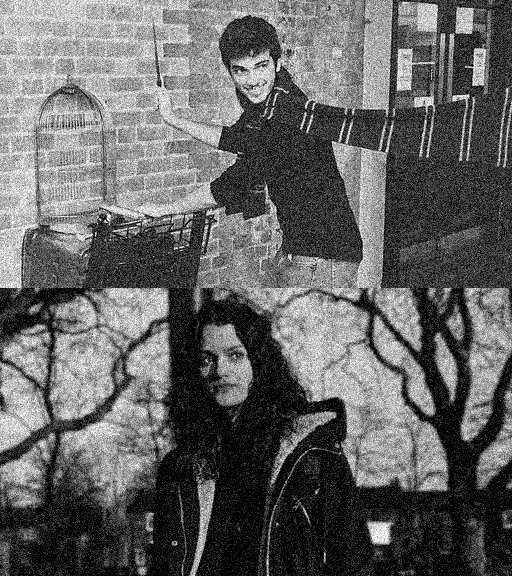


Salt and Pepper noise:


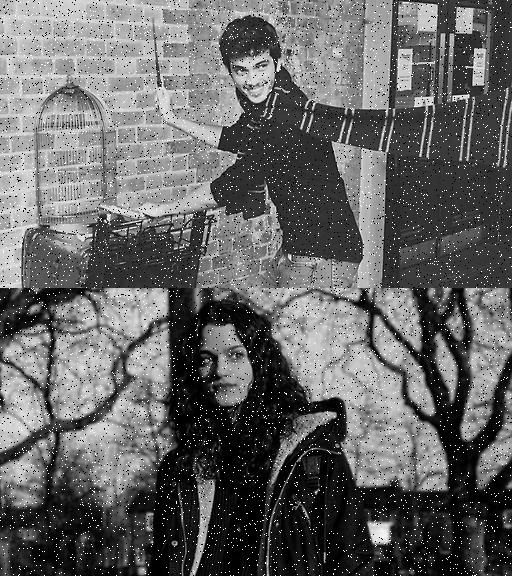

In [0]:
def SP_Amount(x):
  amount = x/90 + 0.3
  return amount

#AM is 03115100
last = 0
prelast = 0

GaussianNoise =   ski.random_noise(np.uint8(bobGRAY),'gaussian',last)
GaussianNoise = np.array(255*GaussianNoise, dtype = 'uint8')
print('Gaussian noise:')
cv2_imshow(GaussianNoise)

SPNoise =  ski.random_noise(bobGRAY,'s&p', last ,SP_Amount(prelast))
SPNoise= np.array(255*SPNoise, dtype = 'uint8')
print()
print('Salt and Pepper noise:')
cv2_imshow(SPNoise)

4.   Να εφαρμόσετε **mean**, **median** και **gaussian filtering** και στις δύο εικόνες του προηγούμενου βήματος. Μπορείτε να πειραματιστείτε με την παραμετροποίηση των φίλτρων. Να τυπώσετε το αποτέλεσμα της εφαρμογής κάθε φιλτρου (συμπεριλαμβανομένων των διάφορων πειραματισμών που θα κάνετε). Συγκρίνετε τα αποτελέσματα και εξηγήστε ποιό φίλτρο απέδωσε καλύτερα σε κάθε εικόνα και γιατί.
<br>
**Απάντηση**

Σε κάθε ένα από τα παρακάτω κελιά υλοποιείται ένα από τα ζητούμενα φίλτρα. Θα υπάρχει επεξήγηση πάνω από το κελί του κώδικα για κάθε φίλτρο, ενώ στο τέλος βλέπουμε ποιο φίλτρο απέδωσε καλύτερα σε κάθε εικόνα. 

Τα φίλτρα mean και gaussian είναι γραμμικά φίλτρα (πολλαπλασιασμός στοιχείο με στοιχείο του πυρήνα και της εικόνας) και ομαλοποιούν μια εικόνα μάλλον ομοιόμορφα, συμπεριλαμβανομένων και των ακμών μεταξύ διαφορετικών περιοχών της. <br>
Ανήκουν στην γενικότερη κατηγορία των βαθυπερατών φίλτρων.

Αντίθετα, το median φίλτρο είναι μη γραμμικό και κάνει αποθορυβοποίηση, διατηρώντας τα χαρακτηριστικά της εικόνας και αφαιρώντας μόνο το θόρυβο. Ο διαχωρισμός μεταξύ θορύβου και χαρακτηριστικών είναι συχνά υποκειμενικός.
<br>
Ανήκει στην γενικότερη κατηγορία των φίλτρων αποθορυβοποίησης.

Όσον αφορά την υλοποίηση των φίλτρων, χρησιμοποιήθηκαν οι έτοιμες συναρτήσεις mean και median από την βιβλιοθήκη skimage.filters.rank και η gaussian από την skimage.filters

<br>
<br>        

**Mean Filter**

Αρχικά υλοποιείται και δοκιμάζεται το mean φίλτρο.

Το συγκεκριμένο φίλτρο ουσιαστικά αντικαθιστά κάθε pixel της εικόνας με την μέση τιμή των γειτόνων της. Έτσι, pixel τα οποία δεν εκφράζουν τον περιβάλλοντα χώρο απαλείφονται. <br>
Είναι γραμμικό φίλτρο

Για την λειτουργία του φίλτρου ορίζουμε ένα kernel που δίνεται ως όρισμα στην συνάρτηση, το οποίο καθορίζει το το σχήμα και μέγεθος της γειτονίας του pixel του οποίου υπολογίζεται ο μέσος όρος. 
<br>
Με την χρήση αυτού του φίλτρου πραγματοποιείται λείανση των απότομων μεταβολών της έντασης της εικόνας: Οι ακμές, ή αλλιώς το σύνορο μεταξύ σκοτεινών και φωτεινών εικονοστοιχείων, εξομαλύνονται επειδή τα σκοτεινά εικονοστοιχεία μειώνουν την ένταση των γειτονικών εικονοστοιχείων ενώ τα φωτεινά εικονοστοιχεία κάνουν το αντίθετο. Ουσιαστικά, θολώνει κατα κάποιον τρόπο η εικόνα.

Παρακάτω βλέπουμε την εφαρμογή του φίλτρου και στις δύο εικόνες που παρήχθησαν παραπάνω. Χρησιμοποιήσαμε σαν kernel τόσο δίσκους όσο και τετράγωνα, και δοκιμάσαμε διαφορετικές διαστάσεις. Ορίσαμε kernels με περιττές διαστάσεις ώστε οι γειτονιές να είναι συμμετρικές και να έχουμε καλύτερα αποτελέσματα.

Βλέπουμε πως έχουμε καλά σχετικά αποτελέσματα για τον gaussian θόρυβο και χειρότερα για τον salt and pepper. Παράλληλα, το kernel με μορφή δίσκου παράγει πιο θολές εικόνες απ'ότι το τετράγωνο. 

Για εκείνη με Gaussian θόρυβο θα επιλέγαμε φίλτρο με square kernel 3x3 (και εναλλακτικά εκείνη με 5x5. Στο 3x3 φαίνεται καθαρότερα η εικόνα και οι ακμές της, αλλά υπάρχει περισσότερος θόρυβος σε μεγάλες επιφάνειες όπως τα ρούχα. <br>
Για την εικόνα με Salt and Pepper θόρυβο φίλτρο με disk 5x5 Kernel, αν και κανένα αποτέλεσμα δεν είναι ικανοποιητικό.


Mean Filter
Gaussian Noise (first two rows) and Salt and Pepper noise (last two rows)


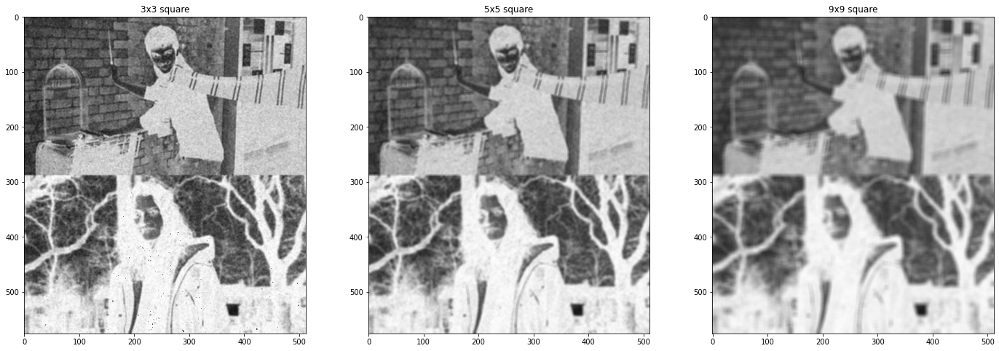

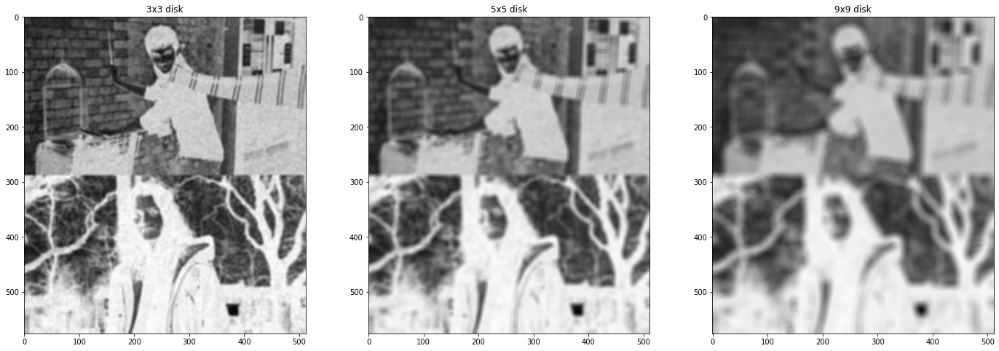

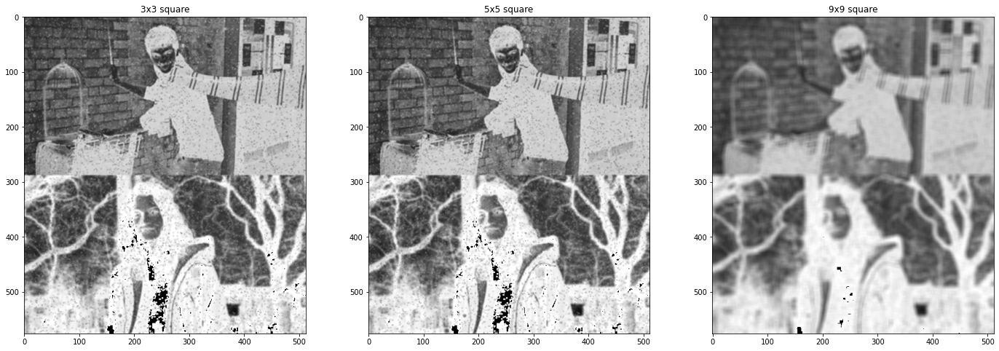

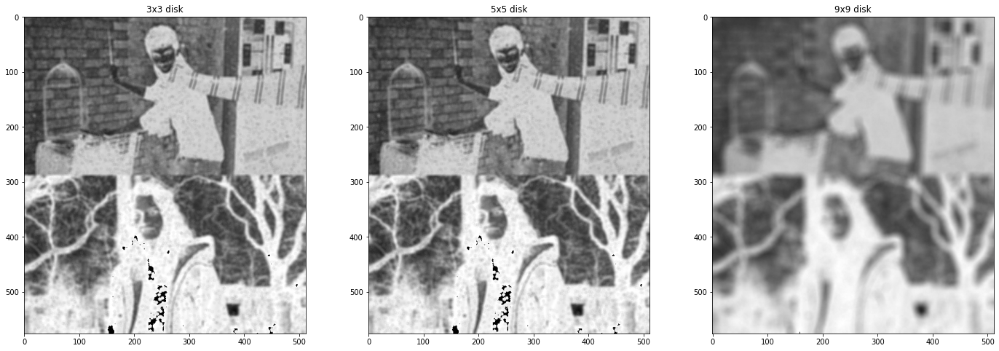

In [0]:
def imshow_all(*images, titles=None, color=0):  #function to show many images in one row
    images = [img_as_float(img) for img in images]

    if titles is None:
        titles = [''] * len(images)
    vmin = min(map(np.min, images))
    vmax = max(map(np.max, images))
    ncols = len(images)
    height = 8
    width = height * len(images)
    fig, axes = plt.subplots(nrows=1, ncols=ncols,
                             figsize=(width, height))
    if color==0: #to print gray images
      for ax, img, label in zip(axes.ravel(), images, titles):
        ax.imshow(img, vmin=vmin, vmax=vmax, cmap=cm.gray)
        ax.set_title(label)
    else: #to print colored images, bgr to rgb
      for ax, img, label in zip(axes.ravel(), images, titles):
        ax.imshow(img[:,:,::-1], vmin=vmin, vmax=vmax)
        ax.set_title(label)

print('Mean Filter')

#here we have filters with square kernel

GaussianMean = filters.rank.mean(GaussianNoise, np.ones((3,3)))
GaussianMean3 = np.array(255*GaussianMean, dtype = 'uint8')

SPMean = filters.rank.mean(SPNoise, np.ones((3,3)))
SPMean3 = np.array(255*SPMean, dtype = 'uint8')

GaussianMean = filters.rank.mean(GaussianNoise, np.ones((5,5)))
GaussianMean5 = np.array(255*GaussianMean, dtype = 'uint8')

meanS = filters.rank.mean(SPNoise, np.ones((5,5)))
SPMean5 = np.array(255*SPMean, dtype = 'uint8')


GaussianMean = filters.rank.mean(GaussianNoise, np.ones((9,9)))
GaussianMean9 = np.array(255*GaussianMean, dtype = 'uint8')


SPMean = filters.rank.mean(SPNoise, np.ones((9,9)))
SPMean9 = np.array(255*SPMean, dtype = 'uint8')


#here we have filters with disk kernel

GaussianMeanD = filters.rank.mean(GaussianNoise, disk(3))
GaussianMeanD3 = np.array(255*GaussianMeanD, dtype = 'uint8')

SPMeanD = filters.rank.mean(SPNoise, disk(3))
SPMeanD3 = np.array(255*SPMeanD, dtype = 'uint8')

GaussianMeanD = filters.rank.mean(GaussianNoise, disk(5))
GaussianMeanD5 = np.array(255*GaussianMeanD, dtype = 'uint8')

meanS = filters.rank.mean(SPNoise, disk(5))
SPMeanD5 = np.array(255*SPMeanD, dtype = 'uint8')

GaussianMeanD = filters.rank.mean(GaussianNoise, disk(9))
GaussianMeanD9 = np.array(255*GaussianMeanD, dtype = 'uint8')

SPMeanD = filters.rank.mean(SPNoise, disk(9))
SPMeanD9 = np.array(255*SPMeanD, dtype = 'uint8')

print('Gaussian Noise (first two rows) and Salt and Pepper noise (last two rows)')

imshow_all(GaussianMean3, GaussianMean5, GaussianMean9, titles=['3x3 square', '5x5 square', '9x9 square'])
imshow_all(GaussianMeanD3, GaussianMeanD5, GaussianMeanD9, titles=['3x3 disk', '5x5 disk', '9x9 disk'])

imshow_all(SPMean3, SPMean5, SPMean9, titles=['3x3 square', '5x5 square', '9x9 square'])
imshow_all(SPMeanD3, SPMeanD5, SPMeanD9, titles=['3x3 disk', '5x5 disk', '9x9 disk'])


**Median Φίλτρο**

Το "ενδιάμεσο" φίλτρο παίρνει ένα σύνολο εικονοστοιχείων που ορίζουμε στο kernel και επιστρέφει τη διάμεση τιμή εντός αυτής της γειτονιάς. Συγκεκριμένα, παίρνει όλα τα στοιχεία της γειτονιάς και, αφότου τα κατατάξη αντικαθιστά το στοιχείο με τον διάμεσο.

Επειδή οι περιοχές κοντά σε ακμές θα έχουν πολλές σκοτεινές τιμές και πολλές τιμές φωτεινότητας (σχετικά χωρισμένες σε 2 ομάδες τιμών), ο διάμεσος σε μια ακμή θα είναι πιθανότατα είτε ανοιχτόχρωμος είτε σκοτεινός, αντί για ενδιάμεση τιμή μεταξύ τους. Με αυτόν τον τρόπο δεν εξομαλύνονται οι ακμές.

Παρακάτω βλέπουμε την εφαρμογή του φίλτρου χρησιμοποιήσαμε σαν kernel, ομοίως με προηγουμένως, τόσο δίσκους όσο και τετράγωνα, και δοκιμάζοντας διαφορετικές διαστάσεις. 

Εδώ βλέπουμε πως για την εικόνα με Gaussian Θόρυβο έχουμε όμοια αποτελέσματα με το mean φίλτρο, ενώ για εκέινη με salt and pepper πολύ μεγάλη βελτίωση.
Ξανά, το kernel με μορφή δίσκου παράγει πιο θολές εικόνες απ'ότι το τετράγωνο.


Για εκείνη με gaussian θόρυβο θα επιλέγαμε εκείνη με square kernel 7x7. Γενικά υπάρχει μεγάλη απόκλιση στις δύο εικόνες, αλλά σε μικρότερες διαστάσεις η πάνω εικόνα εμφανίζει καλά απότελέσματα, η κάτω έχει πολύ θόρυβο. <br>
Για την εικόνα με Salt and Pepper θόρυβο θα επιλεγαμε φίλτρο με square 5x5 Kernel.



Median Filter
Gaussian Noise (first two rows) and Salt and Pepper noise (last two rows)


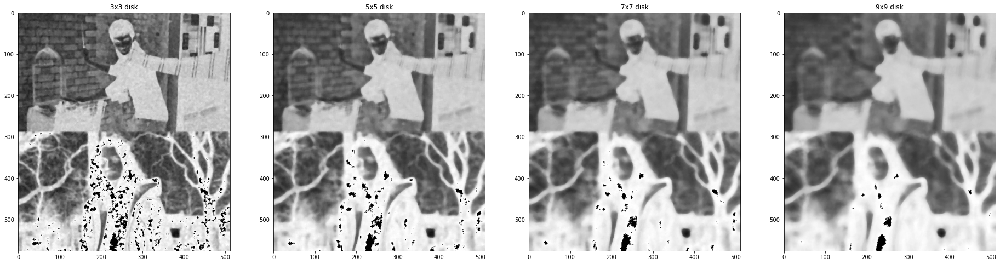

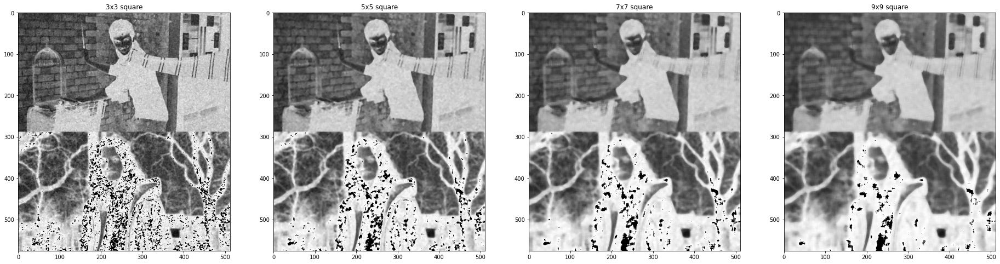

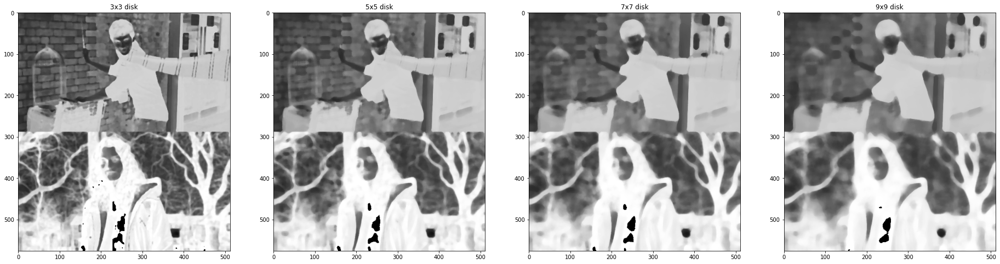

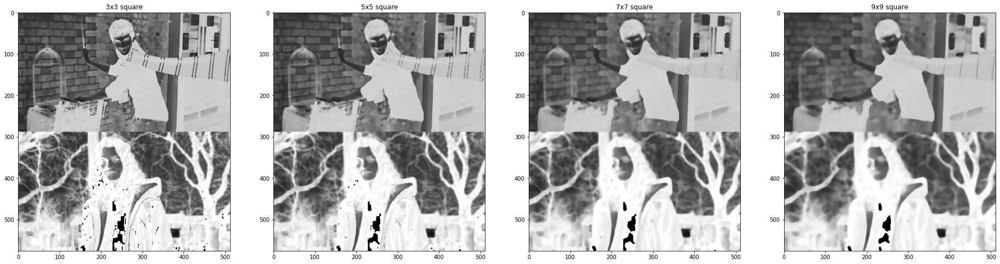

In [0]:
print('Median Filter')


#here we have filters with disk kernel

GaussianMedianD = filters.rank.median(GaussianNoise, disk(3))
GaussianMedianD3 = np.array(255*GaussianMedianD, dtype = 'uint8')

SPMedianD = filters.rank.median(SPNoise, disk(3))
SPMedianD3 = np.array(255*SPMedianD, dtype = 'uint8')


GaussianMedianD = filters.rank.median(GaussianNoise, disk(5))
GaussianMedianD5 = np.array(255*GaussianMedianD, dtype = 'uint8')


SPMedianD= filters.rank.median(SPNoise, disk(5))
SPMedianD5 = np.array(255*SPMedianD, dtype = 'uint8')

GaussianMedianD = filters.rank.median(GaussianNoise, disk(7))
GaussianMedianD7 = np.array(255*GaussianMedianD, dtype = 'uint8')

SPMedianD = filters.rank.median(SPNoise, disk(7))
SPMedianD7 = np.array(255*SPMedianD, dtype = 'uint8')

GaussianMedianD = filters.rank.median(GaussianNoise, disk(9))
GaussianMedianD9 = np.array(255*GaussianMedianD, dtype = 'uint8')

SPMedianD = filters.rank.median(SPNoise, disk(9))
SPMedianD9 = np.array(255*SPMedianD, dtype = 'uint8')


#here we have filters with square kernel
GaussianMedian = filters.rank.median(GaussianNoise, np.ones((3,3)))
GaussianMedian3 = np.array(255*GaussianMedian, dtype = 'uint8')

SPMedian = filters.rank.median(SPNoise, np.ones((3,3)) )
SPMedian3 = np.array(255*SPMedian, dtype = 'uint8')

GaussianMedian = filters.rank.median(GaussianNoise, np.ones((5,5)))
GaussianMedian5 = np.array(255*GaussianMedian, dtype = 'uint8')

SPMedian= filters.rank.median(SPNoise, np.ones((5,5)))
SPMedian5 = np.array(255*SPMedian, dtype = 'uint8')


GaussianMedian = filters.rank.median(GaussianNoise, np.ones((7,7)))
GaussianMedian7 = np.array(255*GaussianMedian, dtype = 'uint8')


SPMedian = filters.rank.median(SPNoise, np.ones((7,7)))
SPMedian7 = np.array(255*SPMedian, dtype = 'uint8')

GaussianMedian = filters.rank.median(GaussianNoise, np.ones((9,9)))
GaussianMedian9 = np.array(255*GaussianMedian, dtype = 'uint8')

SPMedian = filters.rank.median(SPNoise, np.ones((9,9)))
SPMedian9 = np.array(255*SPMedian, dtype = 'uint8')

print('Gaussian Noise (first two rows) and Salt and Pepper noise (last two rows)')
imshow_all(GaussianMedianD3, GaussianMedianD5, GaussianMedianD7, GaussianMedianD9, titles=['3x3 disk', '5x5 disk', '7x7 disk', '9x9 disk'])
imshow_all(GaussianMedian3, GaussianMedian5, GaussianMedian7, GaussianMedian9, titles=['3x3 square', '5x5 square', '7x7 square', '9x9 square'])
imshow_all(SPMedianD3, SPMedianD5, SPMedianD7, SPMedianD9, titles=['3x3 disk', '5x5 disk', '7x7 disk', '9x9 disk'])
imshow_all(SPMedian3, SPMedian5, SPMedian7, SPMedian9, titles=['3x3 square', '5x5 square', '7x7 square', '9x9 square'])


**Gaussian Φίλτρο**

Το Γκαουσσιανό φίλτρο είναι το συνηθέστερο φίλτρο για την επεξεργασία εικόνων. Όπως αναλύθηκε παραπάνω, ανήκει στην ίδια κατηγορία με το φίλτρο μέσης τιμής. Έτσι και εκείνο αντικαθιστά την τιμή ενός pixel συναρτήσει της γειτονιάς του. Ο πυρήνας δίνει την διαβαθμισμένη βαρύτητα (γκαουσιανή συνάρτηση) στα υπόλοιπα pixels με τα οποία συνελίσσεται.

Έτσι στην συνάρτηση μας αυτό που αλλάζει κάθε φορά είναι η τυπική απόκλιση sigma, όπου καθορίζει και το μέγεθος της γειτονιάς.

Η γειτονιά -kernel- ενός pixel που βρίσκεται στην γραμμή r και στήλη c καθορίζεται από την σχέση $k_{r,c}=\frac{1}{2\pi \sigma^2}\cdot e^{- \frac{r^2+c^2}{1\sigma^2}}$. Δηλαδή ακολουθείται κανονική κατανομή και για pixel σε απόσταση μεγαλύτερη από 4σ η παραπάνω τιμή πλησιάζει το μηδέν.

Όπως μπορούμε να δούμε παρακάτω, τα αποτελέσματα έχουν ομοιότητες με εκείνα του mean φίλτρου. Στην γενικότερη βιβλιογραφία προτιμάται το gaussian από το mean φίλτρο διότι δεν έχει τόσο αιχμηρές μεταβάσεις ενώ υπάρχουν διαβαθμίσεις συναρτήσει της απόστασης από το κέντρου του φίλτρου. 

Παρακάτω φαίνεται τα αποτελέσματα της αποθορυβοποίησης με την χρήση του φίλτρου και στις δύο εικόνες, δοκιμάζοντας τιμές σ από 0.5 εώς 3, αυξάνοντας το κατά 0.5.

Όπως ήταν αναμενόμενο, στην εικόνες με gaussian θόρυβο έχουμε βέλτιστη αποθορυβοποίηση, ενώ καθόλου ικανοποιητικά αποτελέσματα στον salt and pepper θόρυβο.


Για εκείνη με gaussian θόρυβο θα επιλέγαμε φίλτρο με σίγμα 0.5 όπου φαίνονται καθαρότερα τα χαρακτηριστικά. <br>
Για την εικόνα με Salt and Pepper θόρυβο φίλτρο με σίγμα 2.5, που είναι ακρετά θολή αλλά φεύγει μεγάλο ποσοστό θορύβου.



Gaussian Filter
Gaussian Noise (first two rows) and Salt and Pepper noise (last two rows)


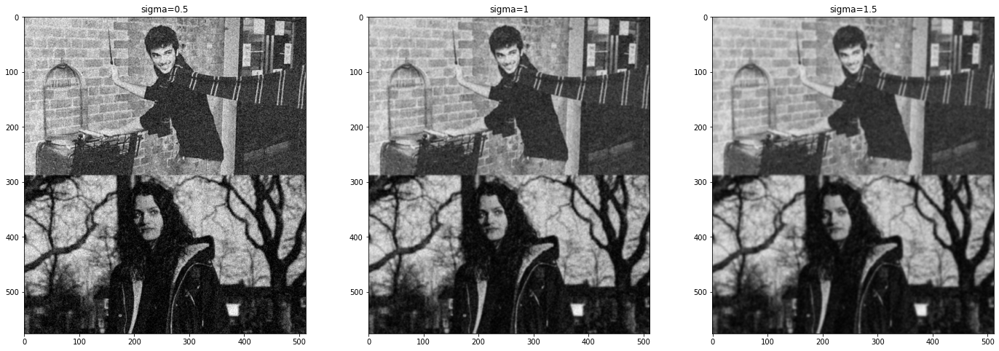

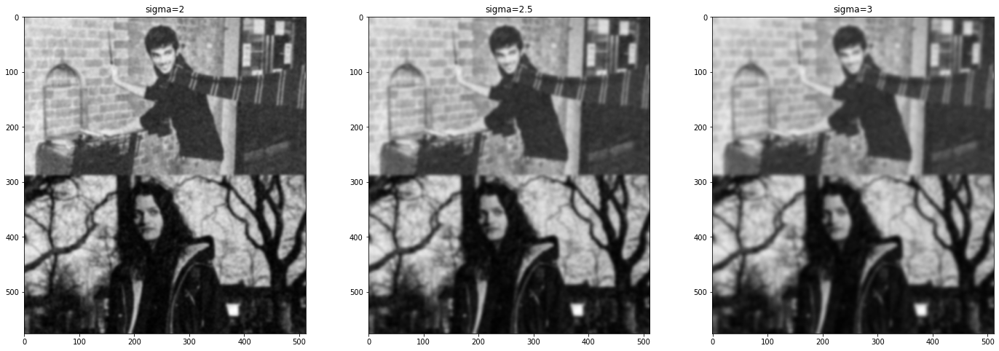

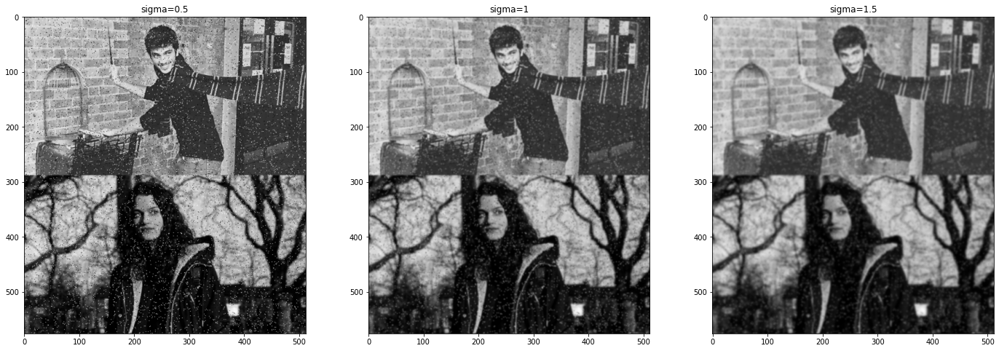

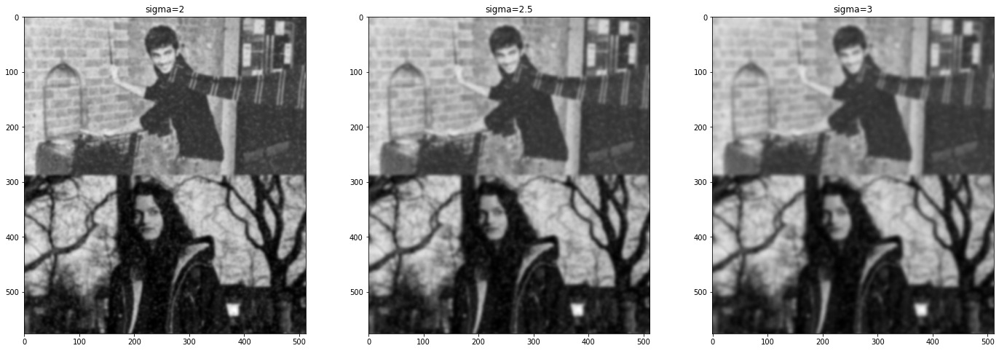

In [0]:
print('Gaussian Filter')

GaussianGaussian = filters.gaussian(GaussianNoise,0.5)
GaussianGaussian0_5 = np.array(255*GaussianGaussian, dtype = 'uint8')


SPGaussian = filters.gaussian(SPNoise,0.5)
SPGaussian0_5 = np.array(255*SPGaussian, dtype = 'uint8')


GaussianGaussian = filters.gaussian(GaussianNoise,1)
GaussianGaussian1 = np.array(255*GaussianGaussian, dtype = 'uint8')

SPGaussian = filters.gaussian(SPNoise,1)
SPGaussian1 = np.array(255*SPGaussian, dtype = 'uint8')


GaussianGaussian = filters.gaussian(GaussianNoise,1.5)
GaussianGaussian1_5 = np.array(255*GaussianGaussian, dtype = 'uint8')

SPGaussian = filters.gaussian(SPNoise,1.5)
SPGaussian1_5 = np.array(255*SPGaussian, dtype = 'uint8')


GaussianGaussian = filters.gaussian(GaussianNoise,2)
GaussianGaussian2 = np.array(255*GaussianGaussian, dtype = 'uint8')


SPGaussian = filters.gaussian(SPNoise,2)
SPGaussian2 = np.array(255*SPGaussian, dtype = 'uint8')


GaussianGaussian = filters.gaussian(GaussianNoise,2.5)
GaussianGaussian2_5 = np.array(255*GaussianGaussian, dtype = 'uint8')


SPGaussian = filters.gaussian(SPNoise,2.5)
SPGaussian2_5 = np.array(255*SPGaussian, dtype = 'uint8')

GaussianGaussian = filters.gaussian(GaussianNoise,3)
GaussianGaussian3 = np.array(255*GaussianGaussian, dtype = 'uint8')


SPGaussian = filters.gaussian(SPNoise,3)
SPGaussian3= np.array(255*SPGaussian, dtype = 'uint8')


print('Gaussian Noise (first two rows) and Salt and Pepper noise (last two rows)')

imshow_all(GaussianGaussian0_5, GaussianGaussian1, GaussianGaussian1_5, titles=['sigma=0.5', 'sigma=1', 'sigma=1.5'])
imshow_all(GaussianGaussian2, GaussianGaussian2_5, GaussianGaussian3, titles=['sigma=2', 'sigma=2.5', 'sigma=3'])

imshow_all(SPGaussian0_5, SPGaussian1, SPGaussian1_5, titles=['sigma=0.5', 'sigma=1', 'sigma=1.5'])
imshow_all(SPGaussian2, SPGaussian2_5, SPGaussian3, titles=['sigma=2', 'sigma=2.5', 'sigma=3'])


Συνολικά βλέπουμε τα εξής:
* Το gaussian φίλτρο είχε το καλύτερο αποτέλεσμα για την εικόνα με γκαουσσιανό θόρυβο, όπως ήταν αναμενόμενο, δεδομένου της κανονικής κατανομής.

* Παρόλου που στο mean φίλτρο έχει γίνει inversing, τα αποτελέσματα του είναι πολύ όμοια με εκείνα του gaussian. Εντούτοις, δεν έχει τόση λεπτομέρεια, αφού δεν υπάρχει η διαβάθμιση που παρτηρείται στο gaussian φίλτρο.

* Το median φίλτρο έχει ομοιότητες στα αποτελέσματα εικόνων διαφορετικού θορύβου.

* Για την εικόνα με Salt and Pepper θόρυβο ικανοποιητικό αποτέλεσμα είχε μόνο το median φίλτρο, γιατί διατηρεί τις ακμές και "επικεντρώνεται" στον θόρυβο μεσα σε αυτές.

5.   Να εφαρμόσετε τους ανιχνευτές ακμών **Laplacian**, **Canny** και **Marr-Hildreth** στα καλύτερα αποτελέσματα αποθορυβοποίησης των δύο εικόνων θορύβου του βήματος 3 (το καλύτερο αποτέλεσμα για την εικόνα gaussian θορύβου και το καλύτερο αποτέλεσμα για την εικόνα salt and pepper θορύβου). Μπορείτε να πειραματιστείτε με την παραμετροποίηση των ανιχνευτών, με στόχο το καλύτερο δυνατό αποτέλεσμα. Να τυπώσετε το αποτέλεσμα της εφαρμογής κάθε φιλτρου (συμπεριλαμβανομένων των διάφορων πειραματισμών που θα κάνετε).

**Απάντηση**

Οι ακμές ορίζονται ως σύνολα συνδεδεμένων εικονοστοιχείων στα οποία η ένταση μιας συνάρτησης εικόνας μεταβάλλεται απότομα.<br>
Σε γενικές γραμμές, οι ανιχνευτές ακμών, λειτουργούν ως εξής:

Αρχικά, εξομαλύνουν την εικόνα για απομάκρυνση θορύβου. Ύστερα υπολογίζουν τις πιθανές θέσεις ακμών και ύστερα υπολογίζουν τα πταγματικά σημεία που συνιστούν ακμές.

Για να πραγματοποιηθούν τα παραπάνω χρησιμοποιούνται οι πρώτες και δεύτερες παράγωγοι, που ουστιαστικά συμβάλλουν στην "όξυνση" της εικόνας. Οι ανιχνευτές Laplacian και Marr-Hildreth, χρησιμοποιούν την δεύτερη παράγωγο, σε αντίθεση με τον Canny που χρησιμοποιεί πρώτη. 

Παρακάτω σε κάθε κελί έχει υλοποιηθεί ένας από τους ανιχνευτές ακμών αντίστοιχα, ο οποίος θα ψάχνει τις ακμές στις βέλτιστα αποθορυβοποιημένες εικόνες από το προηγούμενο βήμα

Ως βέλτιστες εικόνες θα επιλέξουμε:
* για τον gaussian θόρυβο, εκείνη από το gaussian φίλτρο με σίγμα 0.5
* για τον salt and pepper θόρυβο, εκείνη από το median φίλτρο με πυρήνα square 5x5.

<br>
<br>

**Laplacian ανιχνευτής ακμών**

O Laplacian edge detector χρησιμοποιεί τον λαπλασιανό ισοτροπικό τελεστή, στηριζόμενος στο ότι η απόκριση των ισοτροπικών φίλτρων είναι ανεξάρτητη από την κατεύθυνση των ασυνεχειών επί της εικόνας.

Ο λαπλασιανός τελεστής έχει ως εξής:  $\nabla^2 f=\frac{\partial^2f}{\partial x^2}+\frac{\partial^2f}{\partial y^2}$.

Όμως  $ \frac{\partial^2f}{\partial x^2}=f(x+1,y)+f(x-1,y)-2f(x,y)$ και
 $\frac{\partial^2f}{\partial y^2}=f(x,y+1)+f(x,y-1)-2f(x,y)$

$\iff \nabla^2 f=f(x+1,y)+f(x-1,y)+f(x,y+1)+f(x,y-1)-4f(x,y)$.
 
Για την υλοποίηση της εξίωσης αυτής μπορεί να χρησιμοποιηθεί η παρακάτω μάσκα, που δίνει ισοτροπικό αποτέλεσμα για περιστροφές με βήμα αύξησης τις 90$^ο$.

\begin{bmatrix}
0 & 1 & 0\\ 
1 & -4 & 1\\ 
0 & 1 & 0
\end{bmatrix}

Παράλληλα, αν προσθέσουμε έναν όρο για κάθε μία από τις διαγώνιες διευθύνσεις, μπορούμε να δημιουργήσουμε ισοτροπική μάσκα για μεταβολές 45$^ο$ όπως η παρακάτω.
\begin{bmatrix}
-1 & -1 & -1\\ 
-1 & 8 & -1\\ 
-1 & -1 & -1
\end{bmatrix}

Έτσι, χρησιμοποιώντας τις δύο παραπάνω μάσκες κάνουμε συνέλιξη με την εικόνα μας προκαλλώντας την αντίστοιχη μεταβολή.

Ύστερα με την συνάρτηση clip περιορίζουμε τις τιμές που "ξέφυγαν" λόγω της συνέλιξης κάτω από 0 ή πάνω από 255 (και άρα δεν απεικονίζονται στο gray χρωματικό κώδικα).


Παρατηρούμε πως στις εικόνες με Salt and Pepper θόρυβο έχουμε πολύ καθαρά αποτελέσματα, ιδιαίτερα με την δεύτερη μάσκα. Αντίθετα, με τον gaussian θόρυβο δεν είναι ξεκάθαρες οι ακμές. Και στις δύο περιπτώσεις η δεύτερη μάσκα είχε περισσότερο ικανοποιητικά αποτελέσματα.





Laplacian Edge Detector


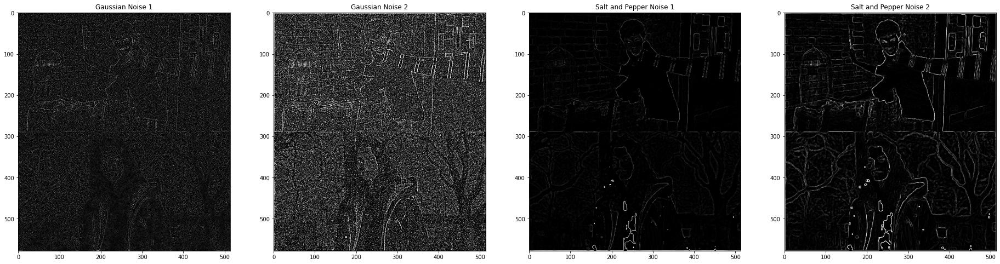

In [0]:
print('Laplacian Edge Detector')

laplacian_kernel = [[0,1,0],[1, -4, 1],[0,1,0]]
laplacian_kernel1 = [[-1,-1,-1],[-1, 8, -1],[-1,-1,-1]]


LaplacianGaussian1 = np.clip(signal.convolve2d(GaussianGaussian0_5, laplacian_kernel),0,255)

LaplacianSP1 = np.clip(signal.convolve2d(SPMedian5, laplacian_kernel),0,255)


LaplacianGaussian2 = np.clip(signal.convolve2d(GaussianGaussian0_5 , laplacian_kernel1),0,255)

LaplacianSP2 = np.clip(signal.convolve2d(SPMedian5, laplacian_kernel1),0,255)

imshow_all(LaplacianGaussian1, LaplacianGaussian2, LaplacianSP1, LaplacianSP2, titles=['Gaussian Noise 1', 'Gaussian Noise 2', 'Salt and Pepper Noise 1', 'Salt and Pepper Noise 2'])


**Ανιχνευτής ακμών Canny**

Ο αλγόριθμος της ανίχνευσης ακμών αποτελείται από 4 βήματα: εξομάλυνση θορύβου με gaussian φίλτρο, εξομάλυνση ακμών με χρήση του φίλτρου sobel, εξάλειψη των μη-μεγίστων (δηλαδή των ανεπιθύμητων ζάρων που υπολογίστηκαν από το sobel) και τέλος την κατωφλίωση υστέρησης όπου ορίζονται το χαμηλό και το υψηλό κατώφλι. Το υψηλό κατώφλι θέτει την τιμή κλίσης ίση με την τιμή της μέγιστης τιμής της ακμής και αντίστοιχα για το χαμηλό κατώφλι.

Το τελευταίο βήμα, μρ το οποίο και θα πειραματιστούμε στον κωδικά μας, εξηγείται καλύτερα και με την παρακάτω εικόνα.
![alt text](https://drive.google.com/uc?export=view&id=13uTZjiR3C3McwtSm3tJHb5xaalhyryrp)    
Οι πιθανές ακμές με κλίση έντασης από το minVal δεν είναι σίγουρα ακμές, ενώ εκείνες με μεγαλύτερο από το maxVal είναι σίγουρα. Για εκείνες στο ενδιάμεσο εξαρτάται από την συνδεσιμότητα τους. <br>
Δηλαδή, στο παράδειγμα μας, η Α είναι σίγουρα ακμή. Αντίστοιχα, η c, αν και είναι στο ενδιάμεσο, αφού συνδέεται με την α που είναι σίγουρη ακμή, είναι και εκείνη. Αντίθετα, η Β δεν συνδέεται με κάποια σίγουρη ακμή και άρα δεν αποτελεί ακμή.

Σημαντικό είναι να αναφέρουμε, όπως θα δούμε παρακάτω, πως οι τιμές τις κλίσεις έντασεις δεν παίρνουν τις ίδιες τιμές μα τα εικονοστοιχεία, οπότε τα κατώφλια μπορούν να ξεφεύγουν από αυτές τις τιμές.


Για τον παρακάτω κώδικα χρησιμοποιήθηκε η έτοιμη υλοποίηση της cv2 βιβλιοθήκης. Το πρώτο όρισμα που παίρνει είναι η εικόνα μας, ενώ το δεύτερο και τρίτο είναι το χαμηλό και το υψηλό αντίστοιχα κατώφλι στο βήμα της κατωφλίωσης υστέρησης. Τέταρτο όρισμα είναι το μέγεθος του πυρήνα του Sobel φίλτρου.

Ύστερα από δοκιμές είδαμε πως ο μέγεθος του πυρήνα στο sobel φίλτρο δεν παρουσιάζει αξισημείωτες μεταβολές, οπότε το αφήσαμε ίσο με τρία και πειραματιστήκαμε με τα όρια κατωφλίωσης.

Παρατηρούμε πως το πάνω κατώφλι διαδραματίζει μεγαλύτερο ρόλο μιας και μειώνονται αρκετά οι ακμές. Προφανώς περισσότερες ακμές έχουμε εκεί που παρατηρούνται μικρότερα άνω κατώφλια. <br>
Ακόμη, στην εικόνα με Salt and Pepper θόρυβο έχουμε βέλτιστα αποτελέσματα, ενώ με τον Gaussian υπάρχει υπερβολική πληροφορία και τα αποτελέσματα δεν είναι κατατοπιστικά.

Canny Edge Detetor
Gaussian Noise (first row) and Salt and Pepper noise (second row)


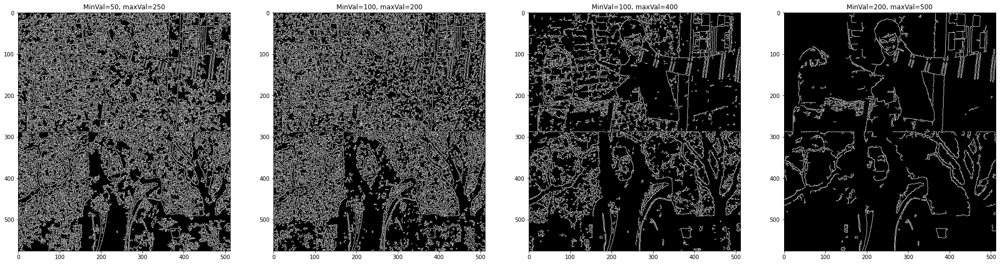

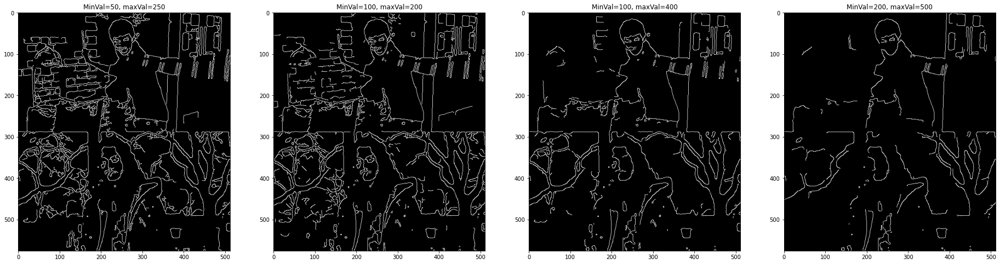

In [0]:
print('Canny Edge Detetor')


CannyGaussian1 = cv2.Canny(GaussianGaussian0_5 ,50,250,3)
CannySP1 = cv2.Canny(SPMedian5,50,250,3)


CannyGaussian2= cv2.Canny(GaussianGaussian0_5,100,200,3)

CannySP2 = cv2.Canny(SPMedian5,100,200,3)


CannyGaussian3 = cv2.Canny(GaussianGaussian0_5, 150,300,3)

CannySP3 = cv2.Canny(SPMedian5, 150,300,3)


CannyGaussian4 = cv2.Canny(GaussianGaussian0_5, 200,500,3)  #gradients in the Canny algorithm can be over 255
CannySP4 = cv2.Canny(SPMedian5, 200,500,3)


print('Gaussian Noise (first row) and Salt and Pepper noise (second row)')

imshow_all(CannyGaussian1, CannyGaussian2, CannyGaussian3, CannyGaussian4, titles=['MinVal=50, maxVal=250','MinVal=100, maxVal=200','MinVal=100, maxVal=400', 'MinVal=200, maxVal=500'])
imshow_all(CannySP1, CannySP2, CannySP3, CannySP4, titles=['MinVal=50, maxVal=250','MinVal=100, maxVal=200','MinVal=100, maxVal=400', 'MinVal=200, maxVal=500'])



**Ανιχνευτής Ακμών Marr-Hildreth**

Ο αλγόριθμος αυτός βασίζεται στην ιδέα πως οι ακμές εξαρτώνται από την κλίμακα της εικόνας.

Προτάθηκε λοιπόν ένας τελεστής που  μπορεί να υπολογίζει μια ψηφιακή προσέγγιση της 1ης και 2ης παραγώγου σε κάθε σημείο της εικόνας και λειτουργεί σε οποιαδήποτε κλίμακα, με τους μεγάλους τελεστές να χρησιμοποιούνται για ανίχνευση θολών ακμών και τους τελέστες μικρού μεγέθους να ανιχνεύουν μικρολεπτομέρειες της εικόνας.

Ο τελεστής αυτός είναι το φίλτρο γνωστό και ως Λαπλασιανή μιας Γκαουσιανής, είναι γνωστή για το σχήμα της σαν μεξικάνικο καπέλο και φαίνεται παρακάτω.
$\nabla^2 G(x,y)=[\frac{x^2+y^2-2σ^2}{σ^4}]\ e^{-\frac{x^2+y^2}{2σ^2}}$,

Εμείς στην υλοποίηση μας χρησιμοποιήσαμε την έτοιμη συνάρτηση scipy.ndimage.gaussian_laplace για να υπολογίσουμε την Λαπλασιανή Γκαουσιανής όπου παίρνει σαν όρισμα το σ. Παρακάτω βλέπουμε τα αποτελέσματα για σ=2 και σ=3, μιας και πέρα αυτών τον τυπών τα αποτελέσματα δεν φανήκαν ικανοποιητικά.

Βλέπουμε πως για τον Gaussian θόρυβο έχουμε καλύτερα αποτελέσματα για σ=3, ενώ για τον Salt nad Pepper θόρυβο το σ=2 απεικονίζει καλύτερα τις τιμές.

Marr-Hildreth Edge Detector


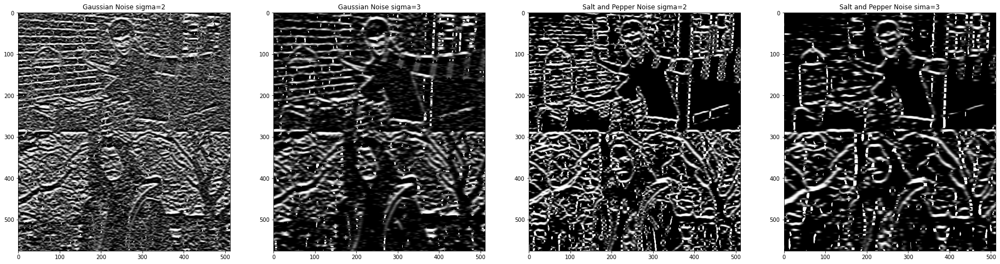

In [0]:
print('Marr-Hildreth Edge Detector')

LoG_kernel = [[0,0,1,0,0],[0,1,2,1,0],[1, 2, -16,2,1],[0,1,2,1,0],[0,0,1,0,0]]

MarrGaussian1 = ndi.gaussian_laplace(GaussianGaussian0_5, 2)

MarrSP1 = ndi.gaussian_laplace(SPMedian5, 2)



MarrGaussian2 = ndi.gaussian_laplace(GaussianGaussian0_5, 3)

MarrSP2 = ndi.gaussian_laplace(SPMedian5, 3)


imshow_all(MarrGaussian1, MarrGaussian2, MarrSP1, MarrSP2, titles=['Gaussian Noise sigma=2', 'Gaussian Noise sigma=3', 'Salt and Pepper Noise sigma=2', 'Salt and Pepper Noise sima=3'])


Συνολικά, θα λέγαμε πως τα καλύτερα αποτελέσματα είχε ο ανιχνευτής Canny, μιας και είχε τα καθαρότερα αποτελέσματα ακμών και για τις δύο εικόνες -για διαφορετικοές παρμέτρους-.

Οι άλλοι δύο ανιχνευτές είχαν πολύ χαμηλής ποιότητας απότελέσματα για τον Salt and Pepper θόρυβο. Ικανοποιητικό βέβαια αποτέλεσμα είχε ο ανιχνευτής ακμών Marr-Hildreth, για την εικόνα με Gaussian θόρυβο, μιας και στον Laplacian υπήρχε μεγάλος βαθμός θορύβου.

6.   Να αναπτύξετε **μέθοδο** που θα δέχεται σαν είσοδο την **αρχική εικόνα** και μια **εικόνα ακμών** και θα επιστρέφει μια εικόνα, στην οποία τα pixels της αρχικής εικόνας, που αντιστοιχούν στα pixels ακμών της εικόνας ακμών, θα έχουν αντικατασταθεί από χρώμα της επιλογής σας (κατά προτίμηση, μαύρο). Να χρησιμοποιήσετε τη μέθοδο αυτή για να παράξετε το cartoonified αποτέλεσμα, χρησιμοποιώντας ως εικόνες ακμών τα αποτελέσματα του βήματος 5. Συγκρίνετε την απόδοση των διαφορετικών αλγορίθμων και πειραματισμών και εξηγήστε με ποιον τρόπο πήρατε το πιο καθαρό και αισθητικά καλύτερο αποτέλεσμα.


**Απάντηση**

Παρακάτω φαίνεται η μέθοδος cartoonify, όπου δέχεται την αρχική μας εικόνα, καθώς και μια εικόνα ακμών, και γυρνάει την αρχική εικόνα με αντικατάσταση των ακμών με μαύρο χρώμα.

Βλέπουμε ύστερα τα αποτελέσματα για όλες τις εικόνες ακμών που είχαμε στο προηγούμενο βήμα.

Βλέπουμε πως ο Laplacian ανιχνευτής ακμών είχε ελάχιστη απόδοση, μιας και υπάρχει πολύ θόρυβος (ειδικά στην εικόνα με Gaussian θόρυβο).

Ο Marr-Hildreth επίσης στην εικόνα με Gaussian θόρυβο δεν είχα ικανοποιητικά αποτελέσματα, όμως οι ακμές είναι εμφανές στην εικόνα με Salt and Pepper θόρυβο.

Τέλος, ο Canny αλγόριθμος δούλεψε πολύ καλά και για τις δύο εικόνες (παρουσιάζει καλά αποτελέσματα για διαφορετικές παραμέτρους σε κάθε μία), και πέτυχε την εύερεση ακμών καλύτερα στην δικιά μας περίπτωση.

<br>

Συνολικά, για να πάρουμε το αισθητικά καλύτερα αποτέλεσμα θέλαμε τις σαφέστερα ορισμένες ακμές. Για παράδειγμα, στα αποτελέσματα του Laplacian ανιχνευτη ακμών, αν και φαινόντουσαν τα σχήματα που σχεδίαζαν οι ακμές, υπήρχε πολύς θόρυβος και έτσι η τελική εικόνα δεν ήταν καθαρή. 

Παράλληλα, στην περίπτωση του Marr-Hildreth, η εικόνα ακμών, αν και δεν είχε τόσο θόρυβο, ήταν θολή. Οι ακμές δεν ήταν σαφώς ορισμένες ενώ είχαν μεγάλο πάχος. Έτσι το τελικό αποτέλεσμα παρουσίαζε μια παραμόρφωση.

Αντίθετα, στον Canny, είτε στις πρώτες περιπτώσεις που εμφανίζονταν πολλές ακμές, είτε στις τελευταίες, ήταν σαφώς ορισμένες και χωρίς θόρυβο ανάμεσα. Έτσι με τις κατάλληλες παραμέτρους προέκυψε αισθητικά καλό αποτέλεσμα.

In [0]:
def cartoonify(source_img, edge_img):
  ind = np.where(edge_img != [0])
  c= zip(ind[0], ind[1])
  temp = np.array(source_img)
  for i in c:
    temp[i[0],i[1]] = [0,0,0]
  return temp

Laplacian Cartoonify


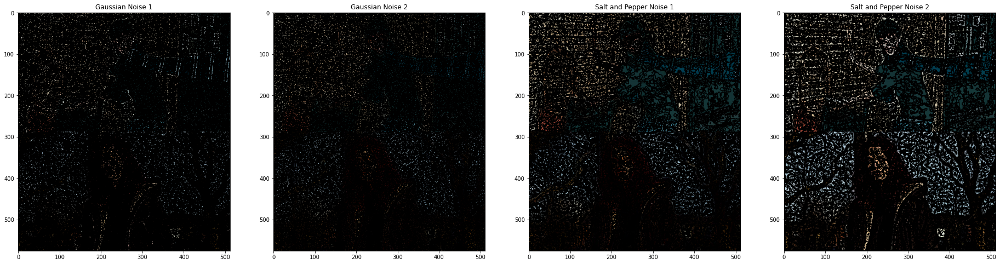

In [0]:
print('Laplacian Cartoonify')

#resize because the laplacian gaussian altered slightly the dimensions

CG1 = cartoonify(bob,cv2.resize(np.float32(LaplacianGaussian1),(512,576)))
CG2 = cartoonify(bob,cv2.resize(np.float32(LaplacianGaussian2),(512,576)))
CSP1 = cartoonify(bob,cv2.resize(np.float32(LaplacianSP1),(512,576)))
CSP2 = cartoonify(bob,cv2.resize(np.float32(LaplacianSP2),(512,576)))

imshow_all(CG1, CG2, CSP1, CSP2, titles=['Gaussian Noise 1', 'Gaussian Noise 2', 'Salt and Pepper Noise 1', 'Salt and Pepper Noise 2'], color=1)


Canny Cartoonify


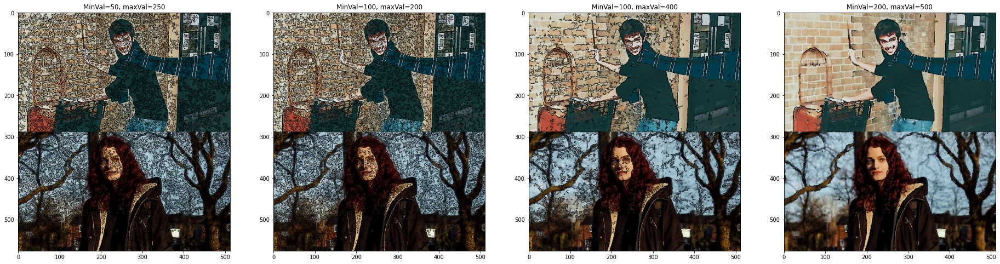

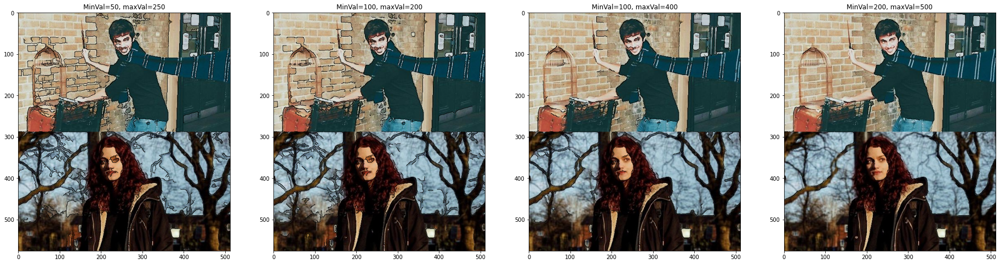

In [0]:
print('Canny Cartoonify')

CG1 = cartoonify(bob,CannyGaussian1)
CG2 = cartoonify(bob,CannyGaussian2)
CG3 = cartoonify(bob,CannyGaussian3)
CG4 = cartoonify(bob,CannyGaussian4)
CSP1 = cartoonify(bob,CannySP1)
CSP2 = cartoonify(bob,CannySP2)
CSP3 = cartoonify(bob,CannySP3)
CSP4 = cartoonify(bob,CannySP4)

imshow_all(CG1, CG2, CG3, CG4, titles=['MinVal=50, maxVal=250','MinVal=100, maxVal=200','MinVal=100, maxVal=400', 'MinVal=200, maxVal=500'], color=1)
imshow_all(CSP1, CSP2, CSP3, CSP4, titles=['MinVal=50, maxVal=250','MinVal=100, maxVal=200','MinVal=100, maxVal=400', 'MinVal=200, maxVal=500'], color=1)

Marr-Hildreth


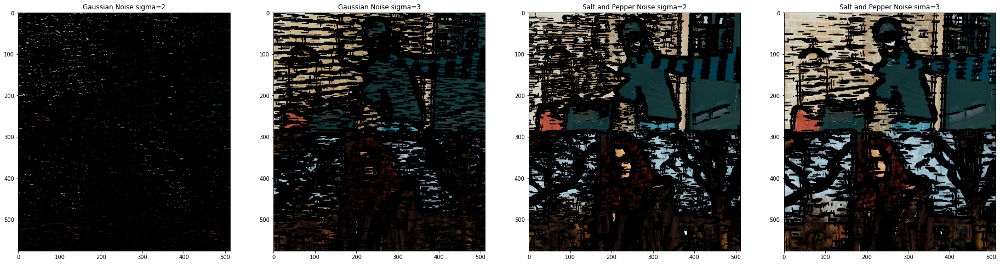

In [0]:
print('Marr-Hildreth')

CG1 = cartoonify(bob,MarrGaussian1)
CG2 = cartoonify(bob,MarrGaussian2)
CSP1 = cartoonify(bob,MarrSP1)
CSP2 = cartoonify(bob,MarrSP2)

imshow_all(CG1, CG2, CSP1, CSP2, titles=['Gaussian Noise sigma=2', 'Gaussian Noise sigma=3', 'Salt and Pepper Noise sigma=2', 'Salt and Pepper Noise sima=3'], color=1)
